In [1]:
from __future__ import division, unicode_literals, print_function  # for compatibility with Python 2 and 3

import matplotlib as mpl 
import matplotlib.pyplot as plt
from matplotlib import rc
from matplotlib.animation import FuncAnimation

%matplotlib inline
%load_ext autoreload
%autoreload 2

# Optionally, tweak styles.
mpl.rc('figure',  figsize=(10, 5))
import numpy as np
import pandas as pd
from pandas import DataFrame, Series  # for convenience
import os
import seaborn as sns
# equivalent to rcParams['animation.html'] = 'html5'
rc('animation', html='html5')
import pims
import pySPM as spm 
import trackpy as tp
import glob
from sxmreader import SXMReader
net_file = '../moire_walk/models/classification_model_30_tmp.h5'

In [2]:
n_range = range(205, 205+200)
N = len(n_range)
SXM_PATH = ["electromigration_30/Image_{0:03}.sxm".format(i) for i in n_range]
frames = SXMReader(SXM_PATH)
molecule_size = 9
detect_kwargs = {
    'minmass' : 2,
    'maxsize' : 4,
    'separation' : 7,
}
f = tp.batch(frames[:], molecule_size, **detect_kwargs)

Frame 199: 14 features


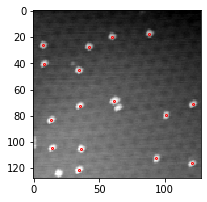

(-0.5, 127.5, 127.5, -0.5)

In [3]:
fig=plt.figure(figsize=(3, 5))
idx = 12
ax = tp.annotate(f[f['frame']==idx], frames[idx], plot_style={'markersize':1})
ax.axis('off')

Frame 199: 14 trajectories present.


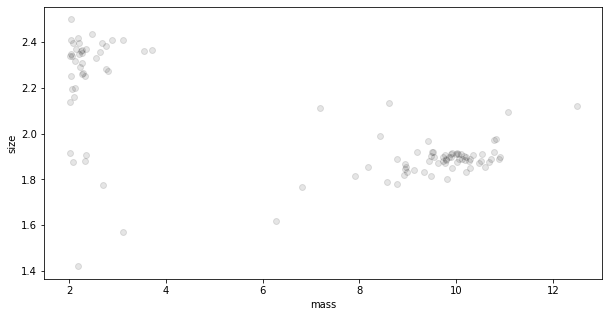

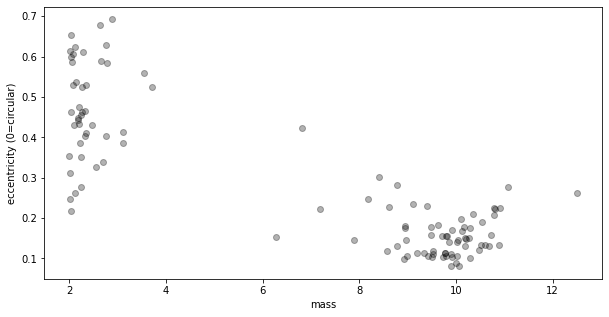

In [4]:
search_kws = {
    'search_range' : 35,
    'adaptive_stop' : 2.0,
    'adaptive_step' : 0.95,
}
t = tp.link(f, **search_kws)
plt.figure()
tp.mass_size(t.groupby('particle').mean()); # convenience function -- just plots size vs. mass
tp.mass_ecc(t.groupby('particle').mean()); # convenience function -- just plots size vs. mass

In [5]:
min_mass, max_mass = 9, 13
min_size, max_size = 1.8, 2.2
min_ecc, max_ecc = 0.05, 0.25
t1 = t[t['ecc'].between(min_ecc, max_ecc) &
       t['size'].between(min_size, max_size) & 
       t['mass'].between(min_mass, max_mass)]
t2 = tp.filter_stubs(t, 180)
# Compare the number of particles in the unfiltered and filtered data.
print('Before:', t['particle'].nunique())
print('After:', t2['particle'].nunique())

Before: 109
After: 9


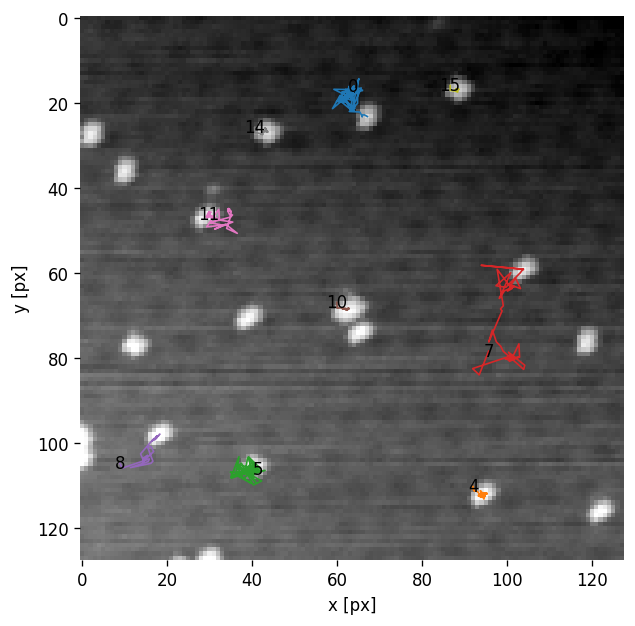

In [6]:
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig=plt.figure(figsize=(8, 6), dpi=120)
ax1=plt.axes(xlim=(0, 256), ylim=(0, 256), frameon=False)
plt.axis('off')
ln, = ax1.plot([], [], lw=3)
ax1.set_prop_cycle(color=['g', 'r', 'c', 'm', 'y', 'k'])
def animate(i):
    plt.cla()
    tp.plot_traj(t2[(t2['frame']<=i+20)], superimpose=frames[i+20], label=True, ax=ax1, plot_style={'alpha' : 1})
    ax1.set_prop_cycle(color=['g', 'r', 'c', 'm', 'y', 'k'])
#     plt.imshow(frames[i], cmap='gray')
# Set up formatting for the movie files
Writer = matplotlib.animation.writers['ffmpeg']
writer = Writer(fps=5, metadata=dict(artist='Me'), bitrate=1800)
line_ani = matplotlib.animation.FuncAnimation(fig, animate, frames=30)
# line_ani.save('claymation.mp4', writer=writer)
line_ani

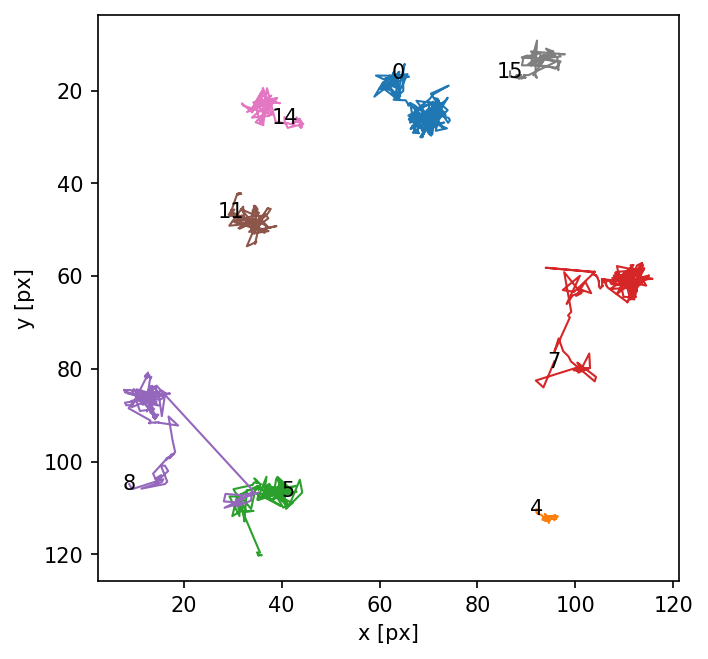

<AxesSubplot:xlabel='x [px]', ylabel='y [px]'>

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))
t2 = t2[~t2.particle.isin([10])] # 10 is double molecule, 11 is near a defect
tp.plot_traj(t2, label=True)

In [8]:
# f = r"tracking.mp4" 
# writer = matplotlib.animation.FFMpegWriter(fps=5)
# line_ani.save(f, writer=writer)

# MSD

In [9]:
d = tp.compute_drift(t2)
tm = tp.subtract_drift(t2.copy(), d)
tm.head(3)

,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
frame,,,,,,,,,,
0,16.092504,63.861776,10.188958,1.860785,0.079690,0.690639,-6.422691,-0.068778,0,0
0,110.271211,92.027898,9.417067,1.918830,0.122035,0.633763,17.569814,0.035789,0,4
0,106.241011,41.377528,9.641864,1.907113,0.101027,0.622929,22.655727,0.027066,0,5


/home/a/as/asai/dsgo/trading/trading/lib/python3.7/site-packages/trackpy/motion.py:235: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.median(level=1) should use df.groupby(level=1).median().
  results = msds.mul(msds['N'], axis=0).mean(level=1)  # weighted average
/home/a/as/asai/dsgo/trading/trading/lib/python3.7/site-packages/trackpy/motion.py:236: FutureWarning: Using the level keyword in DataFrame and Series aggregations is deprecated and will be removed in a future version. Use groupby instead. df.median(level=1) should use df.groupby(level=1).median().
  results = results.div(msds['N'].mean(level=1), axis=0)  # weights normalized


(0.0, 25.0)

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


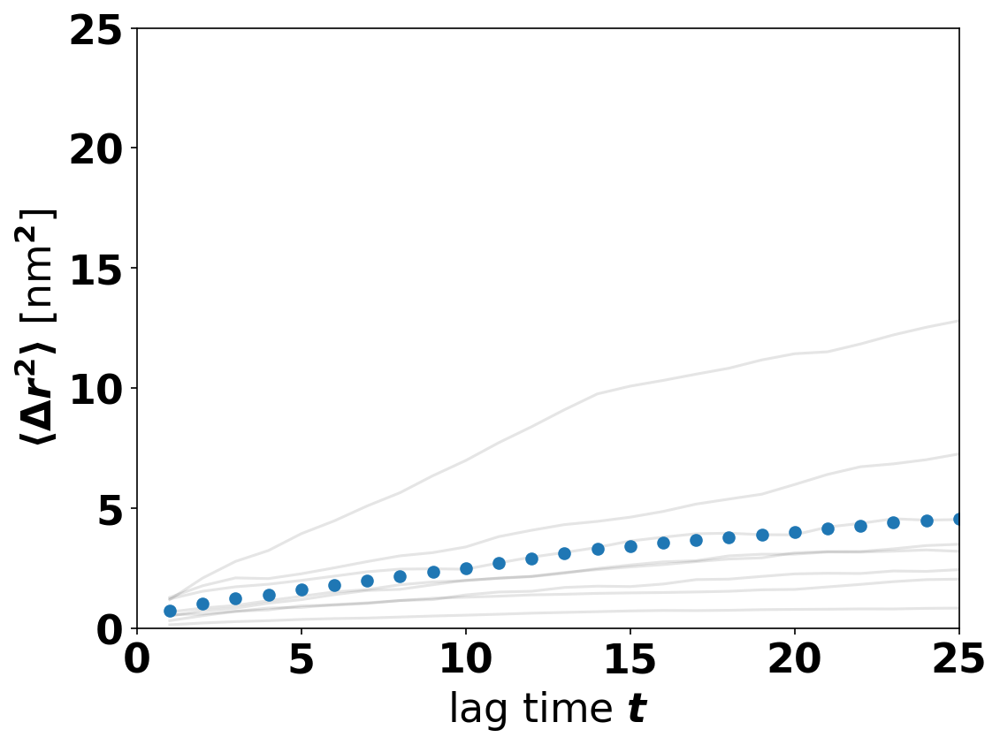

In [10]:
im = tp.imsd(tm, frames.meters_per_pixel * 1e6, 1) * 1e6
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}
import matplotlib
matplotlib.rc('font', **font)
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
ax.plot(im.index, im , 'k-', alpha=0.1)  # black lines, semitransparent
ax.set(ylabel=r'$\langle \Delta r^2 \rangle$ [nm$^2$]',
       xlabel='lag time $t$')
# ax.set_xscale('log')
# ax.set_yscale('log')
em = tp.emsd(tm, frames.meters_per_pixel * 1e6, 1) * 1e6
ax.plot(em.index, em, 'o')
ax.set_xlim(0, 25)
ax.set_ylim(0, 25)

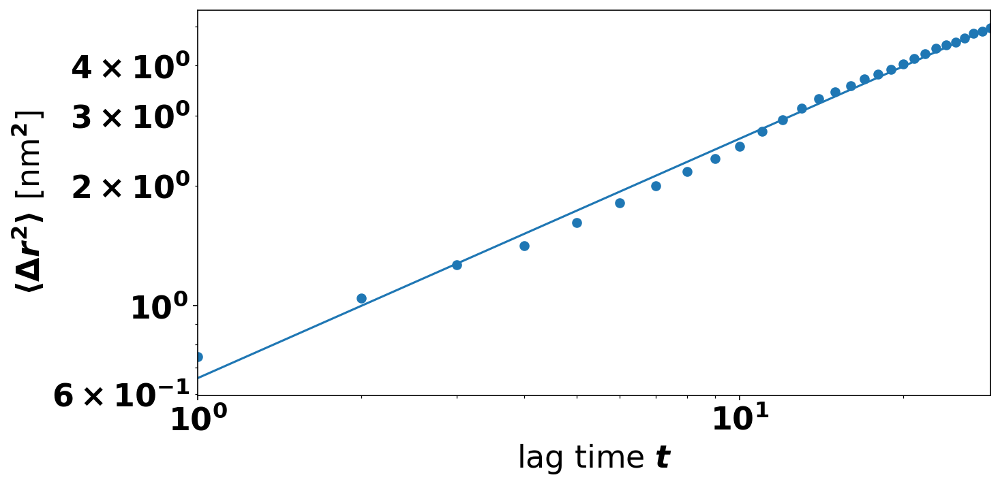

,n,A
msd,0.599942,0.659231


In [11]:
plt.figure()
plt.ylabel(r'$\langle \Delta r^2 \rangle$ [nm$^2$]')
plt.xlabel('lag time $t$');
tp.utils.fit_powerlaw(em[:30])  # performs linear best fit in log space, plots]

# Deep Learning Classification

In [12]:
d = tp.compute_drift(t2)
t3 = tp.subtract_drift(t2.copy(), d)
t21 = t3.copy()

In [13]:
t3.particle.value_counts()

0     200
4     200
5     200
7     200
8     200
11    200
14    200
15    200
Name: particle, dtype: int64

In [15]:
from tensorflow.keras.models import load_model
diff_class = {0 : 'fbm', 1 : 'brownian', 2 : 'ctrw'}
def classification_on_real(dx):
    N=np.shape(dx)[0]
    # net_file = '../moire_walk/models/classification_model_30_tmp.h5'
    model = load_model(net_file)
    predictions = []
    y_preds = []
    for j in range(N):
        dummy = np.zeros((1,29,1))
        dummy[0,:,:] = np.reshape(dx[j,:], (29, 1))
        y_pred = model.predict(dummy) # get the results for 1D 
        ymean = np.mean(y_pred,axis=0) # calculate mean prediction of N-dimensional trajectory 
        prediction = np.argmax(ymean,axis=0) # translate to classification
        predictions.append(prediction)
        print('particle {} --> {}'.format(j + 1, diff_class[prediction]))
        print('y_pred {}'.format(y_pred))
        y_preds.append(y_pred[0])
    return y_preds

# [print(x.shape) for x in paths]
# long_paths = [x[:30,1] for x in paths if x.shape[0] > 30]
# best = 0
# best_score = 0
# for i in range(200 - 30):
#     num_steps = t3.particle.value_counts()
#     long_track_id = num_steps.index[num_steps >= 30]
#     long_paths = [t3[t3.particle == idx].x.values[i:i+30] for idx in long_track_id]
#     x1 = np.array(long_paths)
#     x1 = x1-np.mean(x1)     
#     x_n = x1
#     dx = np.diff(x_n)
#     y_preds = classification_on_real(dx)    
#     score = np.mean(y_preds, axis=0)
#     print(score)
#     if score[2] > best_score:
#         best_score = score[2]
#         best = i
# print(best)
i = 66
num_steps = t3.particle.value_counts()
long_track_id = num_steps.index[num_steps >= 30]
long_paths = [t3[t3.particle == idx].x.values[i:i+30] for idx in long_track_id]
x1 = np.array(long_paths)
x1 = x1-np.mean(x1)     
x_n = x1
dx = np.diff(x_n)
y_preds = classification_on_real(dx)    
score21 = np.mean(y_preds, axis=0)
print(score21)

2022-05-21 12:29:54.575196: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-05-21 12:29:54.575260: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-05-21 12:29:57.011521: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-05-21 12:29:57.011621: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-05-21 12:29:57.011675: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (nuke): /proc/driver/nvidia/version does not exist
2022-05-21 12:29:58.464110: I tensorflow/compiler/mlir/mlir_graph_optimi

particle 1 --> brownian
y_pred [[0.04604125 0.8903627  0.06359617]]
particle 2 --> ctrw
y_pred [[0.06550705 0.30055916 0.63393384]]
particle 3 --> ctrw
y_pred [[0.01630358 0.12298958 0.8607068 ]]
particle 4 --> ctrw
y_pred [[0.02174873 0.11318518 0.86506605]]
particle 5 --> ctrw
y_pred [[0.06500477 0.34614894 0.5888462 ]]
particle 6 --> brownian
y_pred [[0.16776854 0.80988663 0.02234483]]
particle 7 --> ctrw
y_pred [[0.0265016  0.14986612 0.82363236]]
particle 8 --> ctrw
y_pred [[0.02909808 0.17397778 0.7969241 ]]
[0.05474669 0.363372   0.5818813 ]


## 23K

In [44]:
n_range = range(1, 1+200)
N = len(n_range)
SXM_PATH = ["electromigration_30/Image_{0:03}.sxm".format(i) for i in n_range]
frames = SXMReader(SXM_PATH)
molecule_size = 9
detect_kwargs = {
    'minmass' : 2,
    'maxsize' : 4,
    'separation' : 7,
}
f = tp.batch(frames[:], molecule_size, **detect_kwargs)

Frame 199: 12 features


Frame 199: 12 trajectories present.


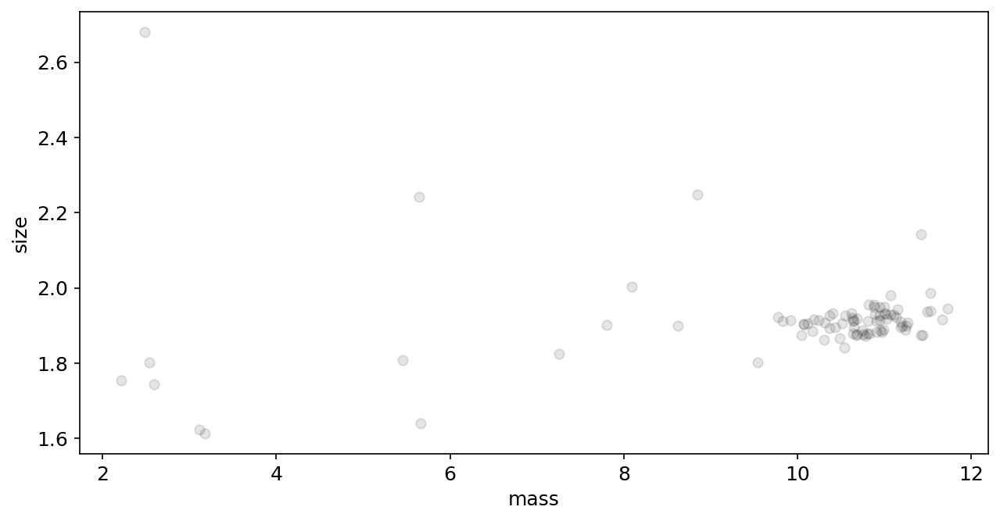

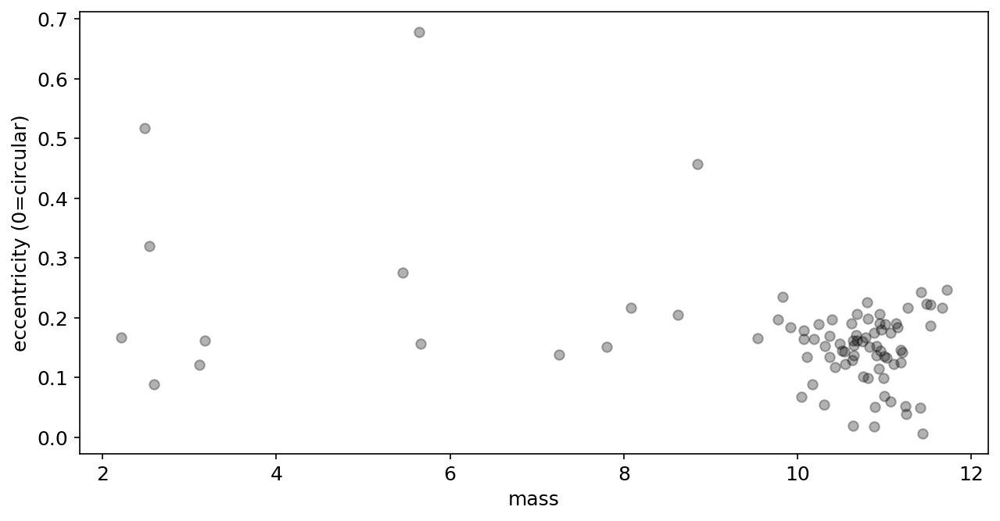

In [45]:
search_kws = {
    'search_range' : 35,
    'adaptive_stop' : 2.0,
    'adaptive_step' : 0.95,
}
t = tp.link(f, **search_kws)
plt.figure()
tp.mass_size(t.groupby('particle').mean()); # convenience function -- just plots size vs. mass
tp.mass_ecc(t.groupby('particle').mean()); # convenience function -- just plots size vs. mass

In [46]:
min_mass, max_mass = 9, 13
min_size, max_size = 1.8, 2.2
min_ecc, max_ecc = 0.05, 0.25
t1 = t[t['ecc'].between(min_ecc, max_ecc) &
       t['size'].between(min_size, max_size) & 
       t['mass'].between(min_mass, max_mass)]
t2 = tp.filter_stubs(t, 30)
# Compare the number of particles in the unfiltered and filtered data.
print('Before:', t['particle'].nunique())
print('After:', t2['particle'].nunique())

Before: 85
After: 19


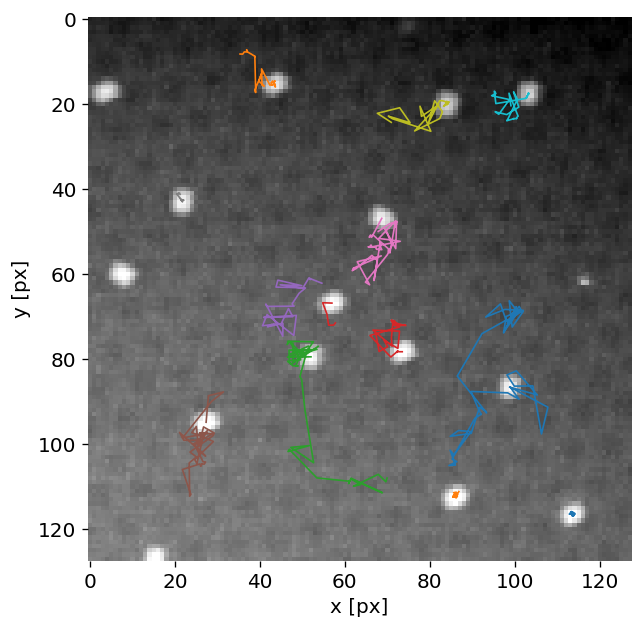

In [47]:
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig=plt.figure(figsize=(8, 6), dpi=120)
ax1=plt.axes(xlim=(0, 256), ylim=(0, 256), frameon=False)
plt.axis('off')
ln, = ax1.plot([], [], lw=3)
ax1.set_prop_cycle(color=['g', 'r', 'c', 'm', 'y', 'k'])
def animate(i):
    plt.cla()
    tp.plot_traj(t2[(t2['frame']<=i+20)], superimpose=frames[i+20], label=False, ax=ax1, plot_style={'alpha' : 1})
    ax1.set_prop_cycle(color=['g', 'r', 'c', 'm', 'y', 'k'])
#     plt.imshow(frames[i], cmap='gray')
# Set up formatting for the movie files
Writer = matplotlib.animation.writers['ffmpeg']
writer = Writer(fps=5, metadata=dict(artist='Me'), bitrate=1800)
line_ani = matplotlib.animation.FuncAnimation(fig, animate, frames=30)
# line_ani.save('claymation.mp4', writer=writer)
line_ani

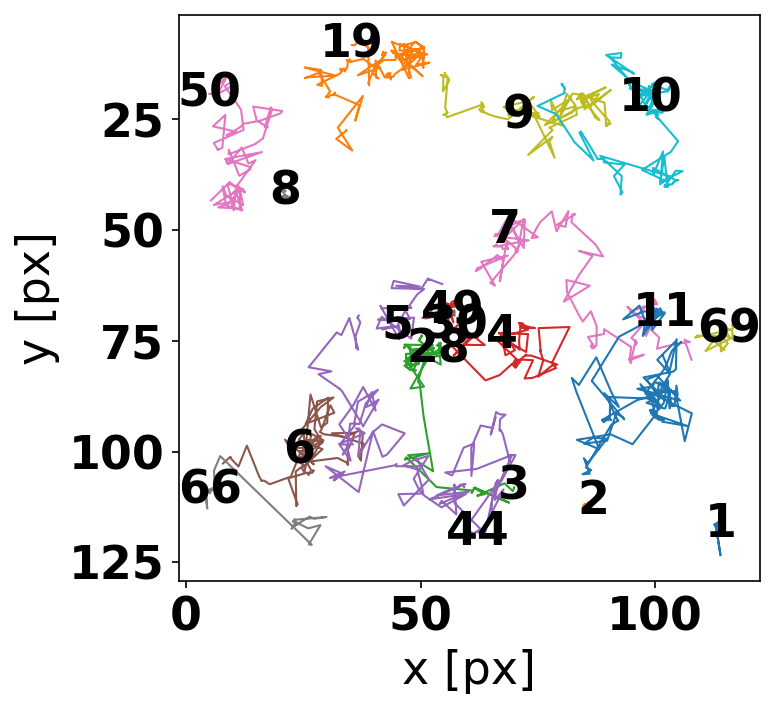

<AxesSubplot:xlabel='x [px]', ylabel='y [px]'>

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))
t2 = t2[~t2.particle.isin([])] # 10 is double molecule, 11 is near a defect
tp.plot_traj(t2, label=True)

In [21]:
d = tp.compute_drift(t2)
t3 = tp.subtract_drift(t2.copy(), d)
t23 = t3.copy()

In [22]:
from tensorflow.keras.models import load_model
diff_class = {0 : 'fbm', 1 : 'brownian', 2 : 'ctrw'}
def classification_on_real(dx):
    N=np.shape(dx)[0]
#     net_file = '../moire_walk/models/classification_model_30.h5'
    model = load_model(net_file)
    predictions = []
    y_preds = []
    for j in range(N):
        dummy = np.zeros((1,29,1))
        dummy[0,:,:] = np.reshape(dx[j,:], (29, 1))
        y_pred = model.predict(dummy) # get the results for 1D 
        ymean = np.mean(y_pred,axis=0) # calculate mean prediction of N-dimensional trajectory 
        prediction = np.argmax(ymean,axis=0) # translate to classification
        predictions.append(prediction)
        print('particle {} --> {}'.format(j + 1, diff_class[prediction]))
        print('y_pred {}'.format(y_pred))
        y_preds.append(y_pred[0])
    return y_preds

# [print(x.shape) for x in paths]
# long_paths = [x[:30,1] for x in paths if x.shape[0] > 30]
# best = 0
# best_score = 0
# for i in range(200 - 30):
#     num_steps = t3.particle.value_counts()
#     long_track_id = num_steps.index[num_steps >= 30]
#     long_paths = [t3[t3.particle == idx].x.values[i:i+30] for idx in long_track_id]
#     x1 = np.array(long_paths)
#     x1 = x1-np.mean(x1)     
#     x_n = x1
#     dx = np.diff(x_n)
#     y_preds = classification_on_real(dx)    
#     score = np.mean(y_preds, axis=0)
#     print(score)
#     if score[2] > best_score:
#         best_score = score[2]
#         best = i
# print(best)
i = 0
num_steps = t3.particle.value_counts()
long_track_id = num_steps.index[num_steps >= 30]
long_paths = [t3[t3.particle == idx].x.values[i:i+30] for idx in long_track_id]
x1 = np.array(long_paths)
x1 = x1-np.mean(x1)     
x_n = x1
dx = np.diff(x_n)
y_preds = classification_on_real(dx)    
score23 = np.mean(y_preds, axis=0)
print(score23)

particle 1 --> ctrw
y_pred [[0.01300643 0.12438224 0.86261135]]
particle 2 --> ctrw
y_pred [[0.03344814 0.26434395 0.7022079 ]]
particle 3 --> ctrw
y_pred [[0.03176317 0.21851346 0.74972343]]
particle 4 --> brownian
y_pred [[0.00075621 0.5192802  0.47996354]]
particle 5 --> brownian
y_pred [[0.10248046 0.69566727 0.20185232]]
particle 6 --> brownian
y_pred [[0.15044726 0.806003   0.04354969]]
particle 7 --> brownian
y_pred [[3.2743230e-04 9.9626839e-01 3.4040902e-03]]
particle 8 --> ctrw
y_pred [[0.10349713 0.26083088 0.635672  ]]
particle 9 --> brownian
y_pred [[0.00172679 0.994181   0.00409218]]
particle 10 --> ctrw
y_pred [[0.00686077 0.05807949 0.9350597 ]]
particle 11 --> brownian
y_pred [[0.00361475 0.96560514 0.03078004]]
particle 12 --> brownian
y_pred [[5.7474215e-05 9.9409360e-01 5.8489810e-03]]
particle 13 --> brownian
y_pred [[0.08807075 0.62497586 0.28695336]]
particle 14 --> ctrw
y_pred [[4.6326554e-10 2.2872679e-03 9.9771273e-01]]
particle 15 --> brownian
y_pred [[0.0030

## 25K

In [23]:
n_range = range(616, 616+200)
N = len(n_range)
SXM_PATH = ["electromigration_29/Image_{0:03}.sxm".format(i) for i in n_range]
frames = SXMReader(SXM_PATH)
molecule_size = 9
detect_kwargs = {
    'minmass' : 2,
    'maxsize' : 4,
    'separation' : 7,
}
f = tp.batch(frames[:], molecule_size, **detect_kwargs)

Frame 199: 6 features


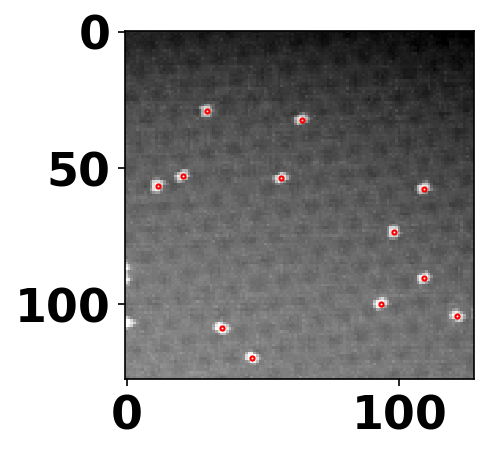

(-0.5, 127.5, 127.5, -0.5)

In [24]:
fig=plt.figure(figsize=(3, 5))
idx = 12
ax = tp.annotate(f[f['frame']==idx], frames[idx], plot_style={'markersize':1})
ax.axis('off')

Frame 199: 6 trajectories present.


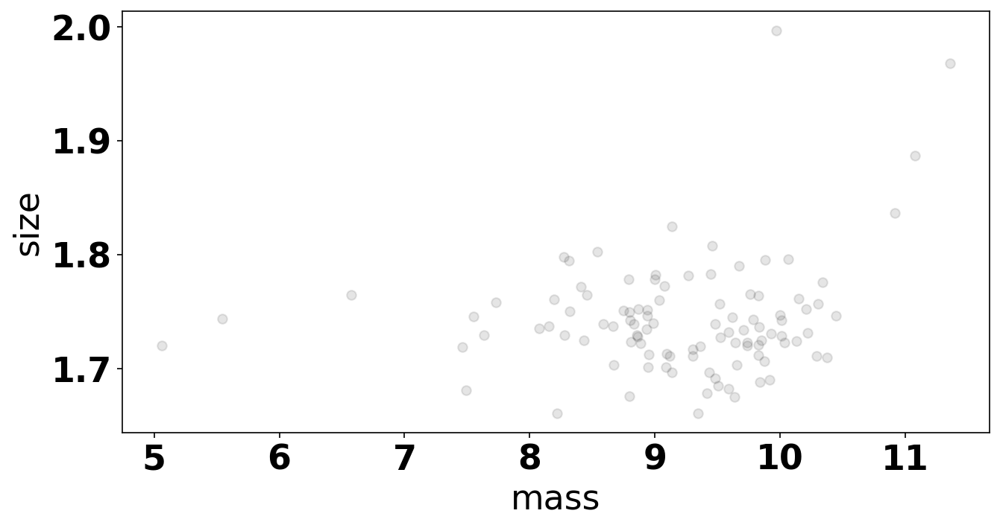

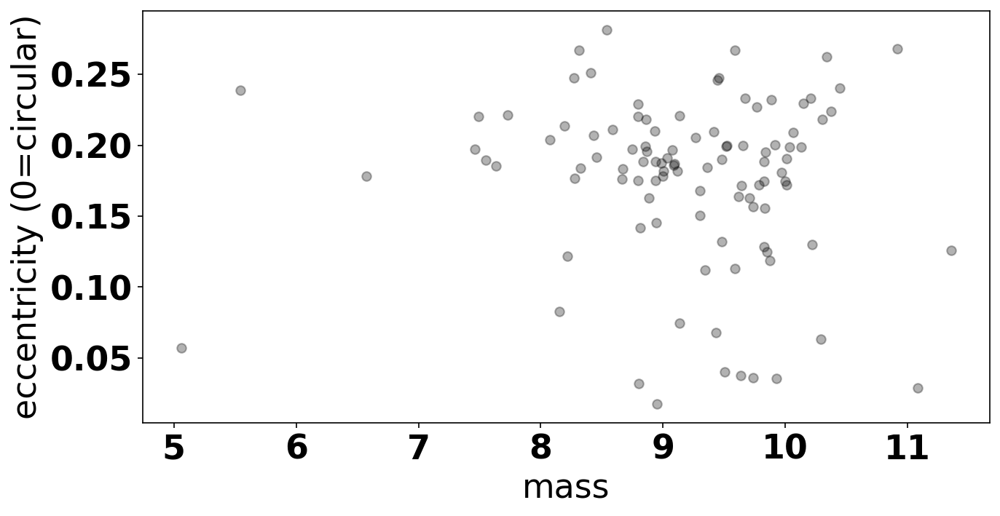

In [25]:
search_kws = {
    'search_range' : 35,
    'adaptive_stop' : 2.0,
    'adaptive_step' : 0.95,
}
t = tp.link(f, **search_kws)
plt.figure()
tp.mass_size(t.groupby('particle').mean()); # convenience function -- just plots size vs. mass
tp.mass_ecc(t.groupby('particle').mean()); # convenience function -- just plots size vs. mass

In [36]:
min_mass, max_mass = 9, 13
min_size, max_size = 1.8, 2.2
min_ecc, max_ecc = 0.05, 0.25
t1 = t[t['ecc'].between(min_ecc, max_ecc) &
       t['size'].between(min_size, max_size) & 
       t['mass'].between(min_mass, max_mass)]
t2 = tp.filter_stubs(t, 30)
# Compare the number of particles in the unfiltered and filtered data.
print('Before:', t['particle'].nunique())
print('After:', t2['particle'].nunique())

Before: 103
After: 11


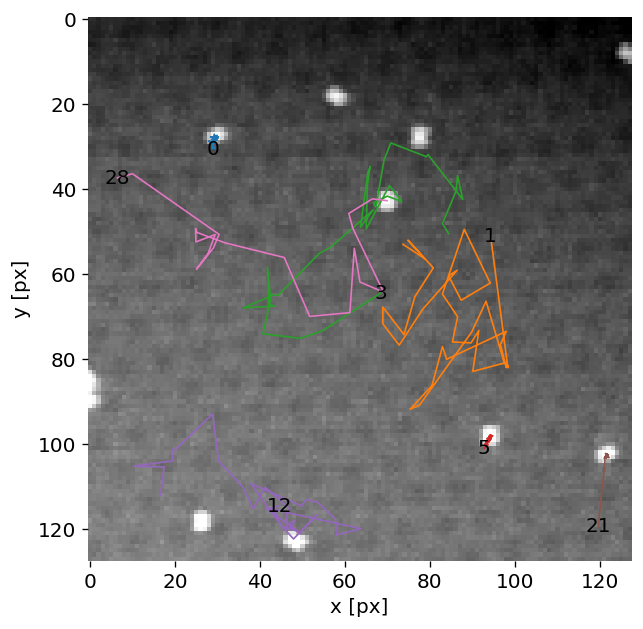

In [37]:
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 150  
plt.ioff()
fig=plt.figure(figsize=(8, 6), dpi=120)
ax1=plt.axes(xlim=(0, 256), ylim=(0, 256), frameon=False)
plt.axis('off')
ln, = ax1.plot([], [], lw=3)
ax1.set_prop_cycle(color=['g', 'r', 'c', 'm', 'y', 'k'])
def animate(i):
    plt.cla()
    tp.plot_traj(t2[(t2['frame']<=i+20)], superimpose=frames[i+20], label=True, ax=ax1, plot_style={'alpha' : 1})
    ax1.set_prop_cycle(color=['g', 'r', 'c', 'm', 'y', 'k'])
#     plt.imshow(frames[i], cmap='gray')
# Set up formatting for the movie files
Writer = matplotlib.animation.writers['ffmpeg']
writer = Writer(fps=5, metadata=dict(artist='Me'), bitrate=1800)
line_ani = matplotlib.animation.FuncAnimation(fig, animate, frames=30)
# line_ani.save('claymation.mp4', writer=writer)
line_ani

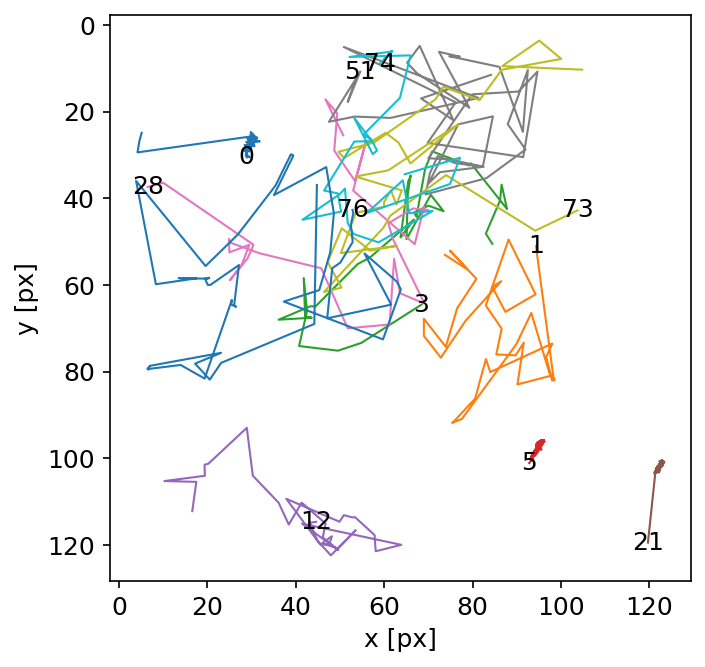

<AxesSubplot:xlabel='x [px]', ylabel='y [px]'>

In [38]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))
t2 = t2[~t2.particle.isin([])] # 0, 5 stuck on defects
tp.plot_traj(t2, label=True)

In [39]:
d = tp.compute_drift(t2)
t3 = tp.subtract_drift(t2.copy(), d)
t25 = t3.copy()

In [40]:
from tensorflow.keras.models import load_model
diff_class = {0 : 'fbm', 1 : 'brownian', 2 : 'ctrw'}
def classification_on_real(dx):
    N=np.shape(dx)[0]
#     net_file = '../moire_walk/models/classification_model_30.h5'
    model = load_model(net_file)
    predictions = []
    y_preds = []
    for j in range(N):
        dummy = np.zeros((1,29,1))
        dummy[0,:,:] = np.reshape(dx[j,:], (29, 1))
        y_pred = model.predict(dummy) # get the results for 1D 
        ymean = np.mean(y_pred,axis=0) # calculate mean prediction of N-dimensional trajectory 
        prediction = np.argmax(ymean,axis=0) # translate to classification
        predictions.append(prediction)
        print('particle {} --> {}'.format(j + 1, diff_class[prediction]))
        print('y_pred {}'.format(y_pred))
        y_preds.append(y_pred[0])
    return y_preds

# [print(x.shape) for x in paths]
# long_paths = [x[:30,1] for x in paths if x.shape[0] > 30]
# best = 0
# best_score = 0
# for i in range(200 - 30):
#     num_steps = t3.particle.value_counts()
#     long_track_id = num_steps.index[num_steps >= 30]
#     long_paths = [t3[t3.particle == idx].x.values[i:i+30] for idx in long_track_id]
#     x1 = np.array(long_paths)
#     x1 = x1-np.mean(x1)     
#     x_n = x1
#     dx = np.diff(x_n)
#     y_preds = classification_on_real(dx)    
#     score = np.mean(y_preds, axis=0)
#     print(score)
#     if score[2] > best_score:
#         best_score = score[2]
#         best = i
# print(best)
i = 0
num_steps = t3.particle.value_counts()
long_track_id = num_steps.index[num_steps >= 30]
long_paths = [t3[t3.particle == idx].x.values[i:i+30] for idx in long_track_id]
x1 = np.array(long_paths)
x1 = x1-np.mean(x1)     
x_n = x1
dx = np.diff(x_n)
y_preds = classification_on_real(dx)    
score25 = np.mean(y_preds, axis=0)
print(score25)

particle 1 --> brownian
y_pred [[1.9838029e-04 9.9797755e-01 1.8240660e-03]]
particle 2 --> brownian
y_pred [[2.2794835e-04 9.9888688e-01 8.8525121e-04]]
particle 3 --> brownian
y_pred [[5.4075327e-03 9.9382013e-01 7.7230635e-04]]
particle 4 --> brownian
y_pred [[3.9253840e-15 6.3429803e-01 3.6570197e-01]]
particle 5 --> brownian
y_pred [[2.0228875e-19 9.0585691e-01 9.4143152e-02]]
particle 6 --> brownian
y_pred [[1.9394152e-12 9.9845529e-01 1.5447028e-03]]
particle 7 --> brownian
y_pred [[2.3273816e-12 9.9996805e-01 3.1974065e-05]]
particle 8 --> ctrw
y_pred [[4.7789284e-13 1.9298571e-01 8.0701423e-01]]
particle 9 --> brownian
y_pred [[9.6127079e-20 9.9932528e-01 6.7478226e-04]]
particle 10 --> brownian
y_pred [[4.1364854e-16 9.7800714e-01 2.1992866e-02]]
particle 11 --> ctrw
y_pred [[1.3894377e-09 4.1812056e-01 5.8187944e-01]]
[5.3035119e-04 8.2888198e-01 1.7058772e-01]


[12.106359859705474, 4.218489910937524, 2.371419765842168]


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


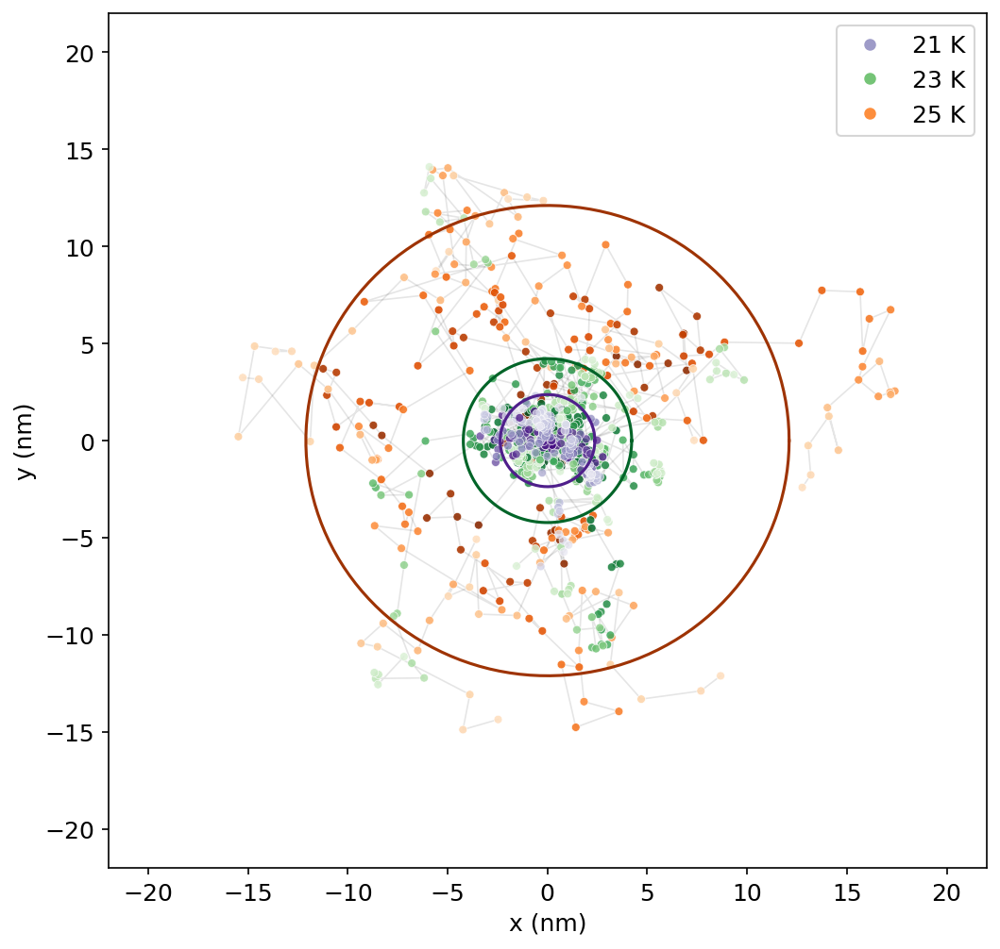

In [31]:
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 12}
import matplotlib
matplotlib.rc('font', **font)

def centered(df):
    df['x_centered'] = df['x'] - df['x'].iloc[0]
    df['y_centered'] = df['y'] - df['y'].iloc[0]
    df['t_centered'] = df['frame'] - df['frame'].iloc[0]
    df['msd'] = np.sqrt(df['x_centered'] **2 + df['y_centered'] ** 2)
    return df.head(30)
c = plt.cm.plasma(np.linspace(0.25, 0.75, 3))
fig, ax = plt.subplots(figsize=(8, 8))
# ax.axhline(0, lw=0.2, alpha=0.8)
# ax.axvline(0, lw=0.2, alpha=0.8)
for df, c, a in zip([t25, t23, t21], ['flare_r', 'light:seagreen_r', 'dark:#69d_r'], [0.9, 0.85, 0.5]):
    df = (df * 50 / 128).groupby('particle').apply(centered).reset_index(drop=True)
    for particle in df.particle.unique():
        tmp = df[df.particle == particle]
        ax.plot(tmp['x_centered'], tmp['y_centered'], alpha=0.1, lw=0.8, color='k', zorder=0)

msds = []
for df, c, a in zip([t25, t23, t21], ['Oranges_r', 'Greens_r', 'Purples_r'], [0.9, 0.85, 0.75]):
    df = (df * 50 / 128).groupby('particle').apply(centered).reset_index(drop=True)
    msds.append(df.groupby('particle').apply(lambda x : x.msd.iloc[-1]).mean())
    for particle in df.particle.unique():
        tmp = df[df.particle == particle]
        hue_norm = (0, tmp.t_centered.max() * 1.2)
        sns.scatterplot(x='x_centered', y='y_centered', size=1, data=tmp, hue='t_centered', hue_norm=hue_norm, palette=c, ax=ax, alpha=a, zorder=1)
#         break
#     break
print(msds)
for msd, c in zip(msds, ['Oranges_r', 'Greens_r', 'Purples_r']):
    angle = np.linspace( 0 , 2 * np.pi , 150 ) 
    c = sns.color_palette(c, as_cmap=True)(0.1)
    radius = msd

    x = radius * np.cos( angle ) 
    y = radius * np.sin( angle )
    ax.plot( x, y, c=c ) 
ax.get_legend().remove()

import matplotlib.lines as mlines
c = ['Oranges_r', 'Greens_r', 'Purples_r']
purple = mlines.Line2D([], [], color=sns.color_palette(c[0], as_cmap=True)(0.5), marker='o', linestyle='None',
                          markersize=5, label='25 K')

green = mlines.Line2D([], [], color=sns.color_palette(c[1], as_cmap=True)(0.5), marker='o', linestyle='None',
                          markersize=5, label='23 K')

orange = mlines.Line2D([], [], color=sns.color_palette(c[2], as_cmap=True)(0.5), marker='o', linestyle='None',
                          markersize=5, label='21 K')

plt.legend(handles=[orange, green, purple])

ax.set_xlabel('x (nm)')
ax.set_ylabel('y (nm)')
ax.set_xlim(-22, 22)
ax.set_ylim(-22, 22)
plt.savefig('exp_traj.svg')

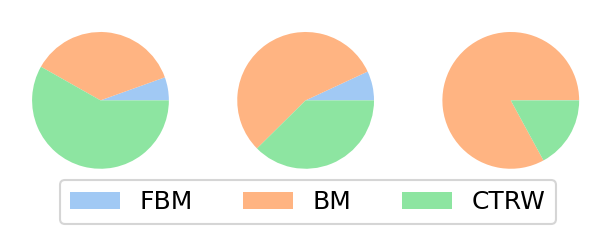

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

#define data

fig, axes = plt.subplots(1, 3, figsize=(5, 3))
data = [score21, score23, score25]
labels = ['FBM', 'BM', 'CTRW']

#define Seaborn color palette to use
colors = sns.color_palette('pastel')[0:5]

for ax, d in zip(axes, data):
    patches, text = ax.pie(list(d), colors=colors)

plt.legend(patches, labels, bbox_to_anchor=(0.8625,0.2), loc="lower right", 
                bbox_transform=fig.transFigure, ncol=3)
plt.savefig('pie_38nm.svg')